# Graph coloring to assign wifi-channels to routers

In [11]:
separator = '   '
vals = []
with open('wifi.mat') as f:
    lines = f.readlines()
    for line in lines:
        val = [float(el) for el in line.split(separator)[1:]]
        vals.append(val)
W = np.array(vals)

vals = []
with open('coords.mat') as f:
    lines = f.readlines()
    for line in lines:
        val = [float(el) for el in line.split(separator)[1:]]
        vals.append(val)
coord = np.array(vals)

In [3]:
nodes = list(range(W.shape[0]))
printmd("$\mathcal{V} = $")
print(nodes)

$\mathcal{V} = $

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]


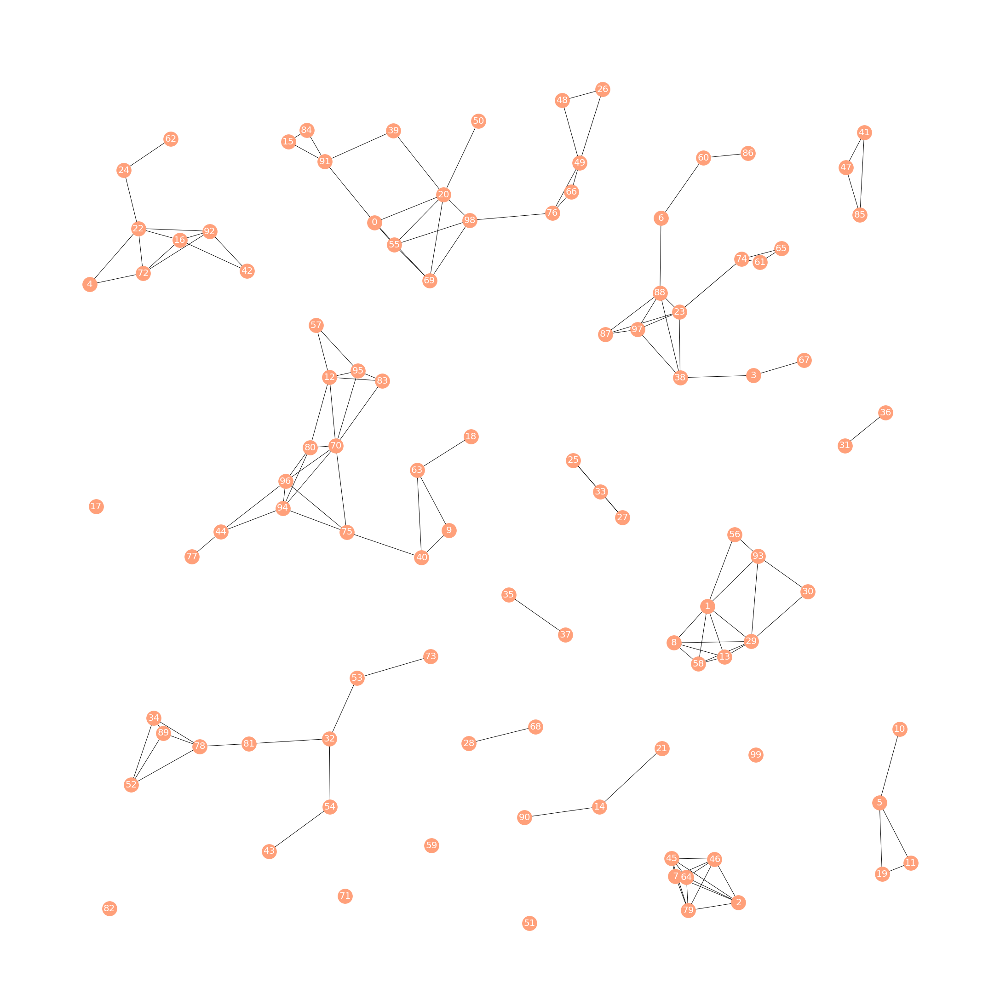

In [13]:
G = nx.from_numpy_matrix(W)
fig = plt.figure(figsize=(30, 30))
pos = coord
nx.draw(G, pos, node_color='#FFA07A', arrowsize=30, node_size=1000, font_size=20, font_color='white', with_labels=True)
fig.savefig(img_dir + 'img ' + str(img_counter) + '.' + image_format, format=image_format)
img_counter += 1

In [4]:
C = {}
C['red'] = 1
C['green'] = 2
C['blue'] = 3
C['yellow'] = 4
C['magenta'] = 5
C['cyan'] = 6
C['olive'] = 7
C['black'] = 8
printmd("$\mathcal{C}$=")
for c in C:
    print(c + ": " + str(C[c]))
    
# Computes the inverse of the noise as a function of time t.
# It returns a tuple (val,descr) where 'val' is a float representing the value computed and 'descr' is a string useful to describe how the function works.
def inv_noise(t=0):
    return t/100, 't/100'

# Compute the cost as a function of 2 states: s and t
# It returns the value computed.
def cost(s,t):
    if t==s:
        return 2
    if abs(t-s)==1:
        return 1
    return 0

printmd("Inverse noise $\eta(t) = " + inv_noise()[1] + "$")

$\mathcal{C}$=

red: 1
green: 2
blue: 3
yellow: 4
magenta: 5
cyan: 6
olive: 7
black: 8


Inverse noise $\eta(t) = t/100$

In [15]:
# Computes the potential of a configuration 'conf', given the graph whose adjacency matrix is W and the cost function 'costf'
def potential(conf, W, costf):
    return 0.5 * (W.reshape(W.shape[0]*W.shape[1]) @ np.array([costf(conf[i],conf[j]) for i in range(W.shape[0]) for j in range(W.shape[0])]))

## Dynamics simulation

In [24]:
initial_configuration = ['red'] * len(G)

In [25]:
t_final = 40

# run 1 simulation and plot state values at each time unit.
states = simulate(C, W, initial_configuration, inv_noise, cost, t_final)
C_rev = dict((v,k) for k,v in C.items())
for t in range(0,t_final+1):
    x = states[t]
    pot = potential(x, W, cost)
    print("Time unit " + str(t))
    print("Configuration:")
    df = pd.DataFrame(data=[C_rev[z] for z in x], index=np.arange(0, len(G)), columns=['state'])
    df.index.name = 'node'
    display(df)
    print("POTENTIAL:", pot)
    print("\n")

Time unit 0
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,red
...,...
95,red
96,red
97,red


POTENTIAL: 274.0


Time unit 1
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,red
...,...
95,red
96,red
97,red


POTENTIAL: 270.0


Time unit 2
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,red
...,...
95,red
96,red
97,red


POTENTIAL: 268.0


Time unit 3
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,red
...,...
95,red
96,red
97,red


POTENTIAL: 264.0


Time unit 4
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,red
...,...
95,red
96,red
97,red


POTENTIAL: 264.0


Time unit 5
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,red
...,...
95,red
96,red
97,red


POTENTIAL: 257.0


Time unit 6
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 256.0


Time unit 7
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 256.0


Time unit 8
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 254.0


Time unit 9
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 250.0


Time unit 10
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 240.0


Time unit 11
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 238.0


Time unit 12
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 241.0


Time unit 13
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 241.0


Time unit 14
Configuration:


,state
node,
0,red
1,red
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 235.0


Time unit 15
Configuration:


,state
node,
0,red
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 223.0


Time unit 16
Configuration:


,state
node,
0,red
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 217.0


Time unit 17
Configuration:


,state
node,
0,red
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 217.0


Time unit 18
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 209.0


Time unit 19
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 209.0


Time unit 20
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 205.0


Time unit 21
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 203.0


Time unit 22
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 202.0


Time unit 23
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 192.0


Time unit 24
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 192.0


Time unit 25
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,red
97,red


POTENTIAL: 189.0


Time unit 26
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 179.0


Time unit 27
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 177.0


Time unit 28
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 173.0


Time unit 29
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 173.0


Time unit 30
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 173.0


Time unit 31
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 173.0


Time unit 32
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 173.0


Time unit 33
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 167.0


Time unit 34
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 163.0


Time unit 35
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 161.0


Time unit 36
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 157.0


Time unit 37
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 153.0


Time unit 38
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 145.0


Time unit 39
Configuration:


,state
node,
0,magenta
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 146.0


Time unit 40
Configuration:


,state
node,
0,blue
1,black
2,red
3,red
4,magenta
...,...
95,red
96,cyan
97,red


POTENTIAL: 146.0




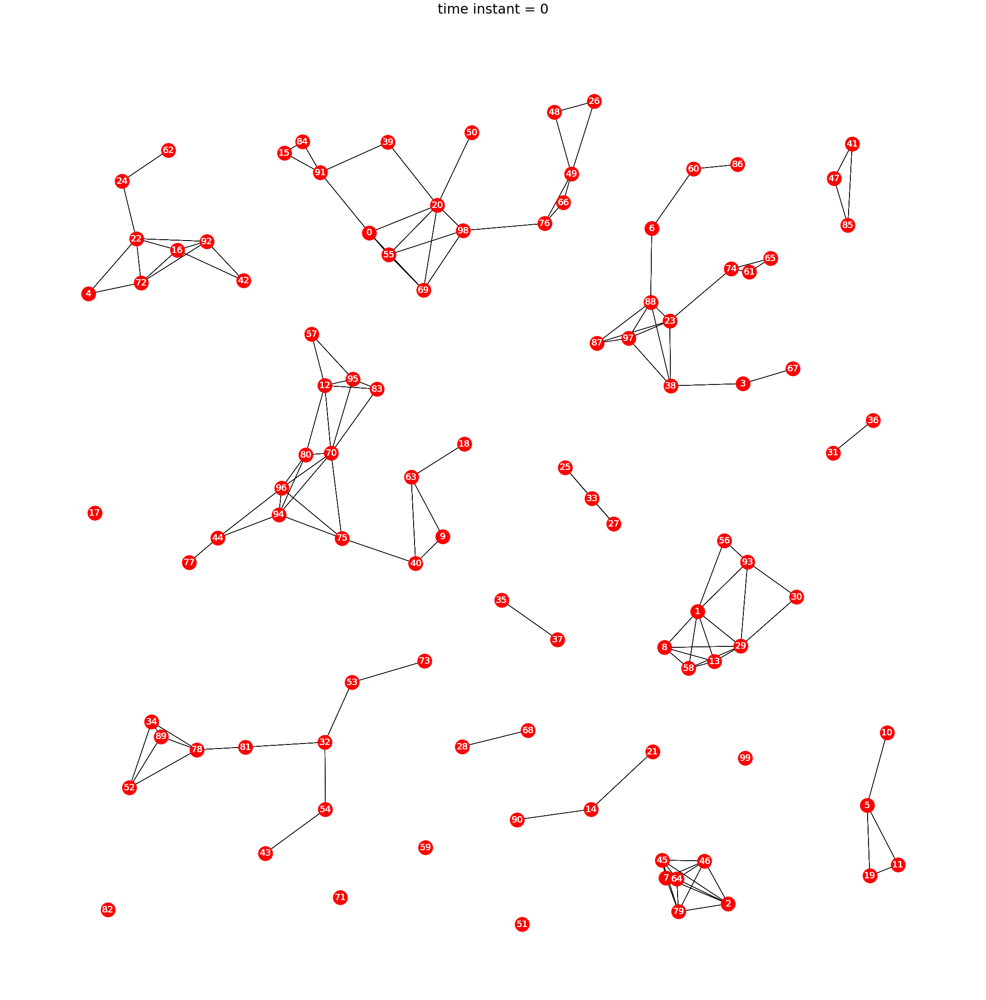

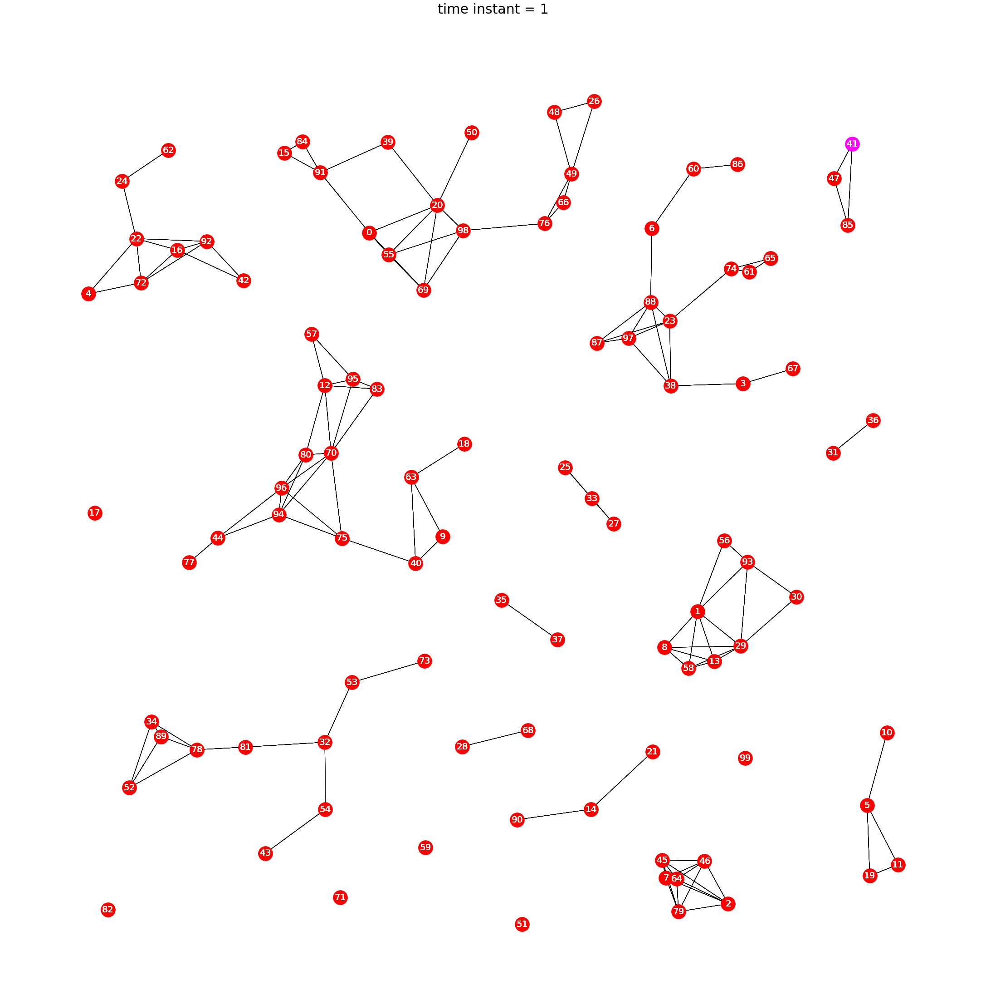

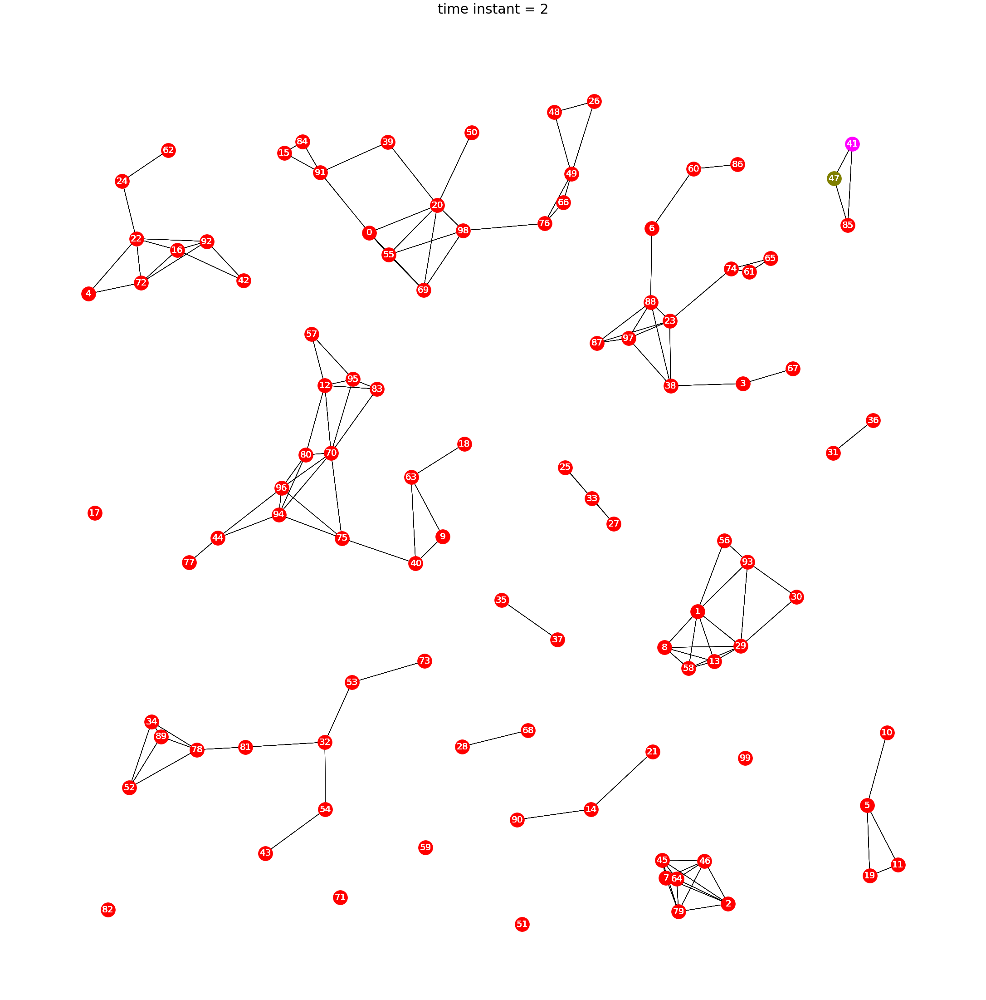

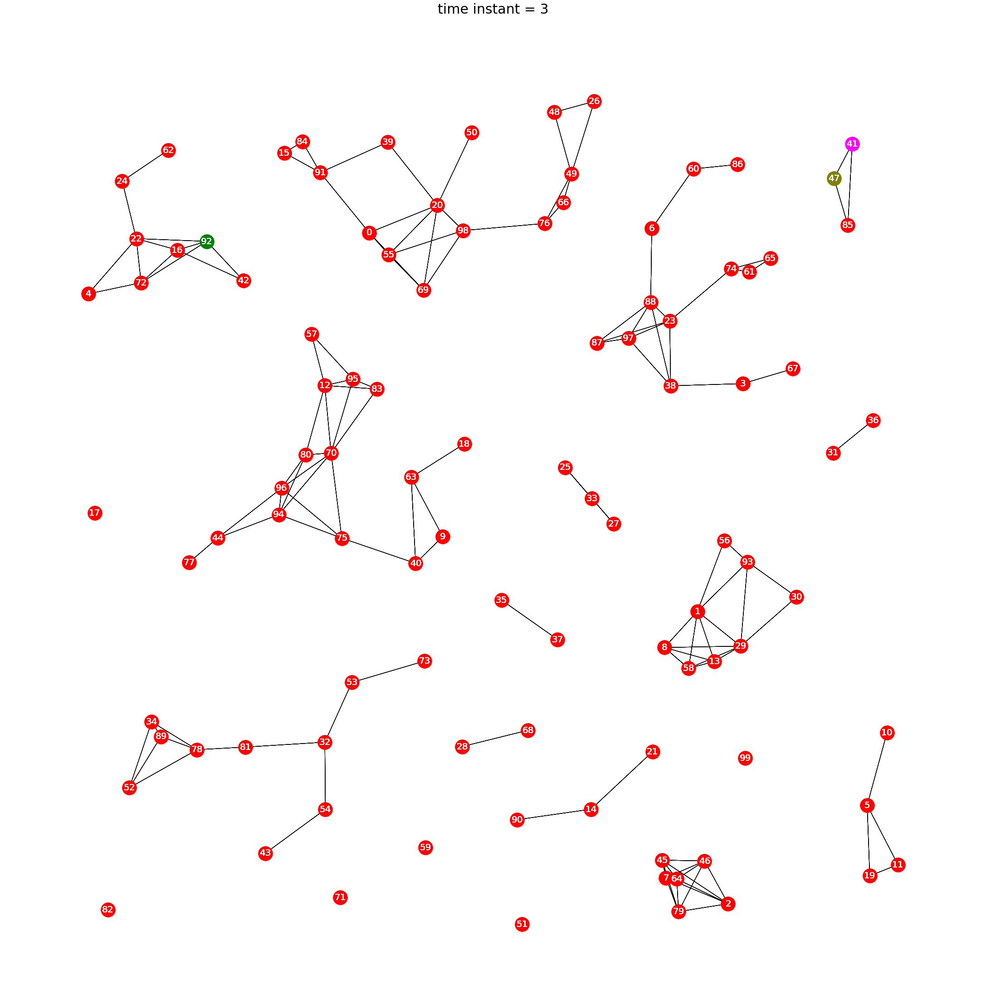

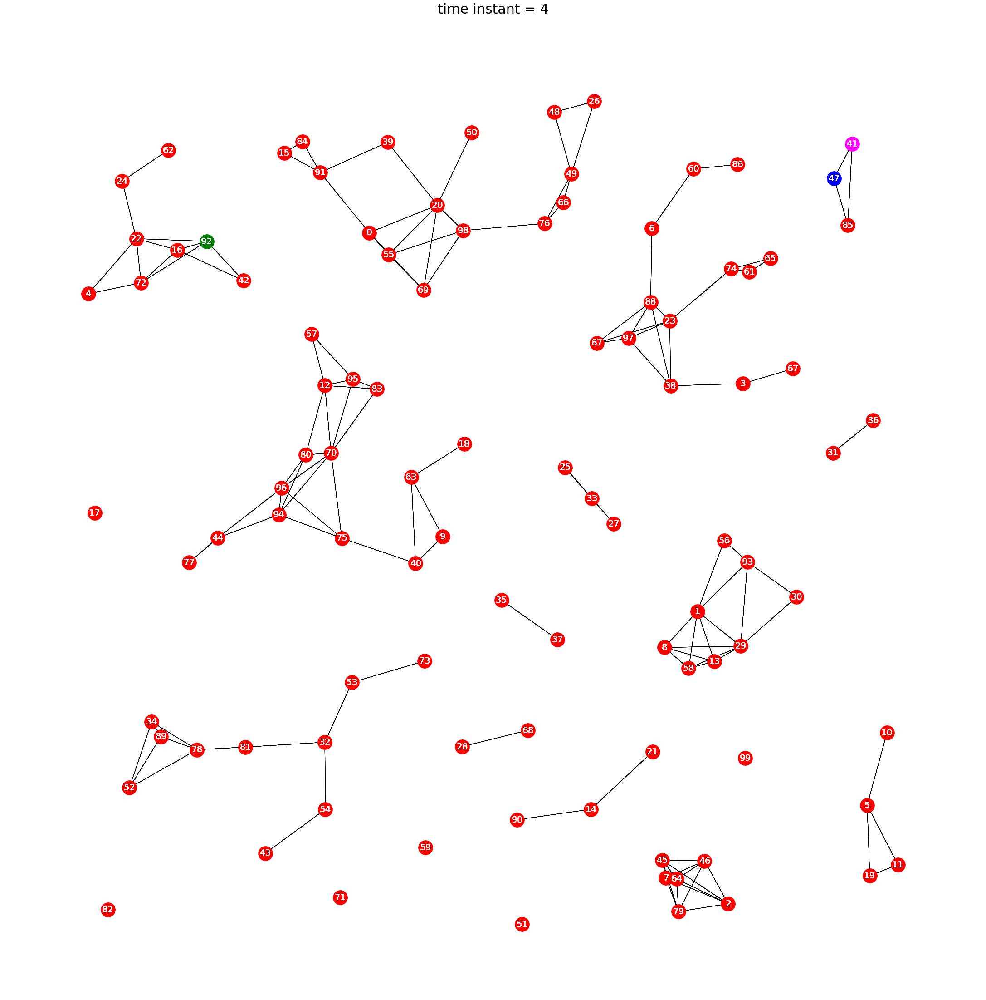

...

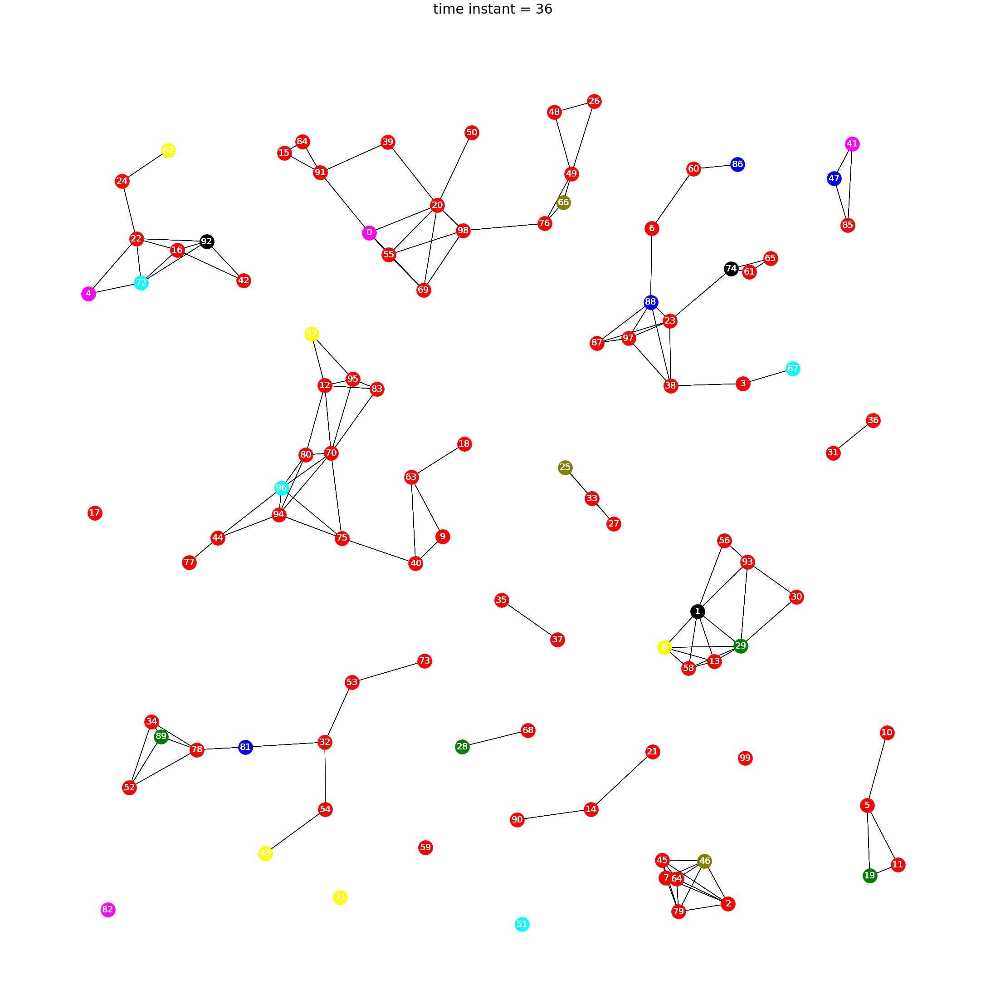

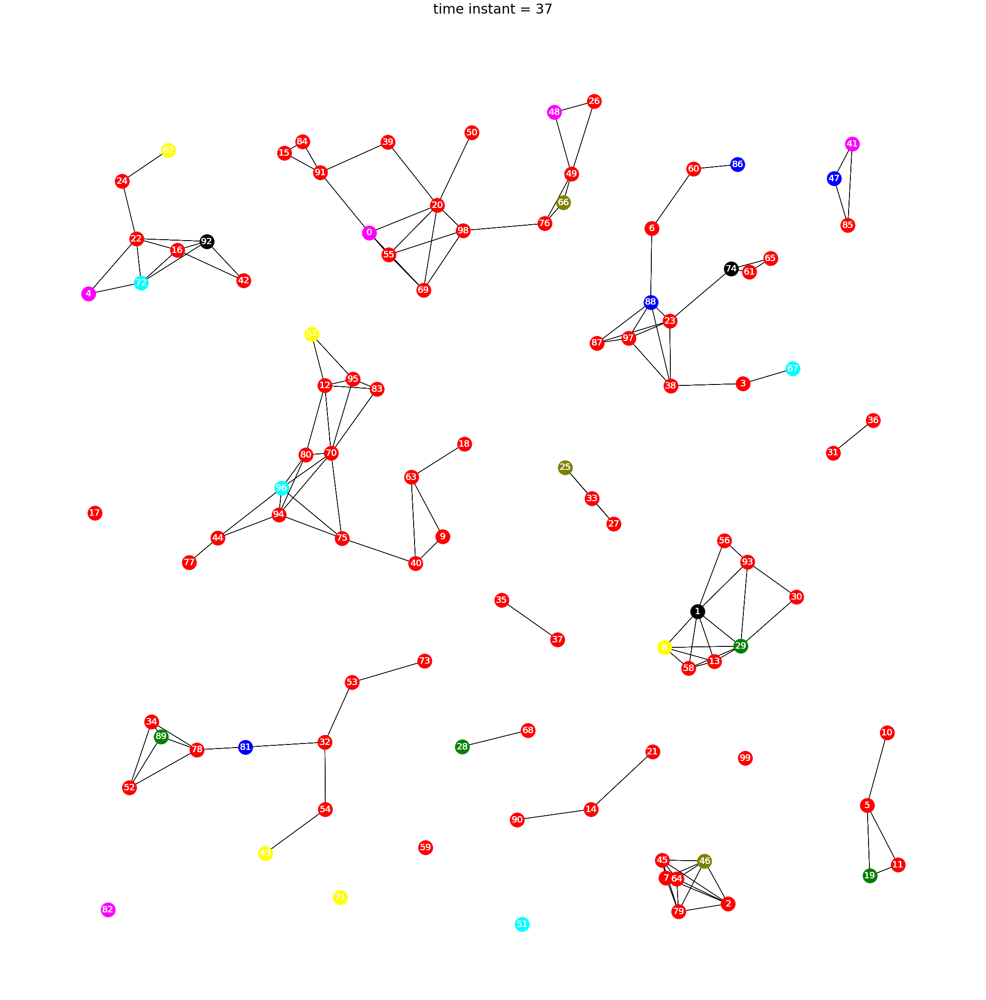

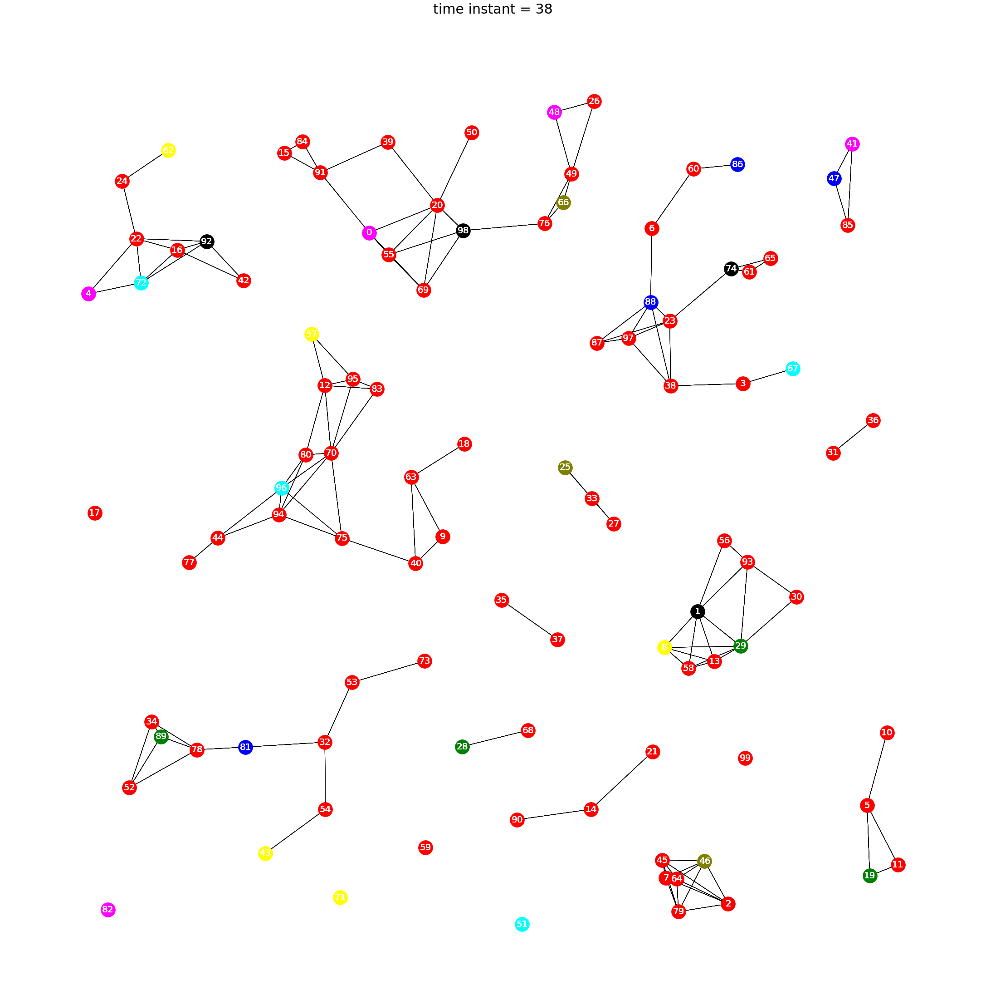

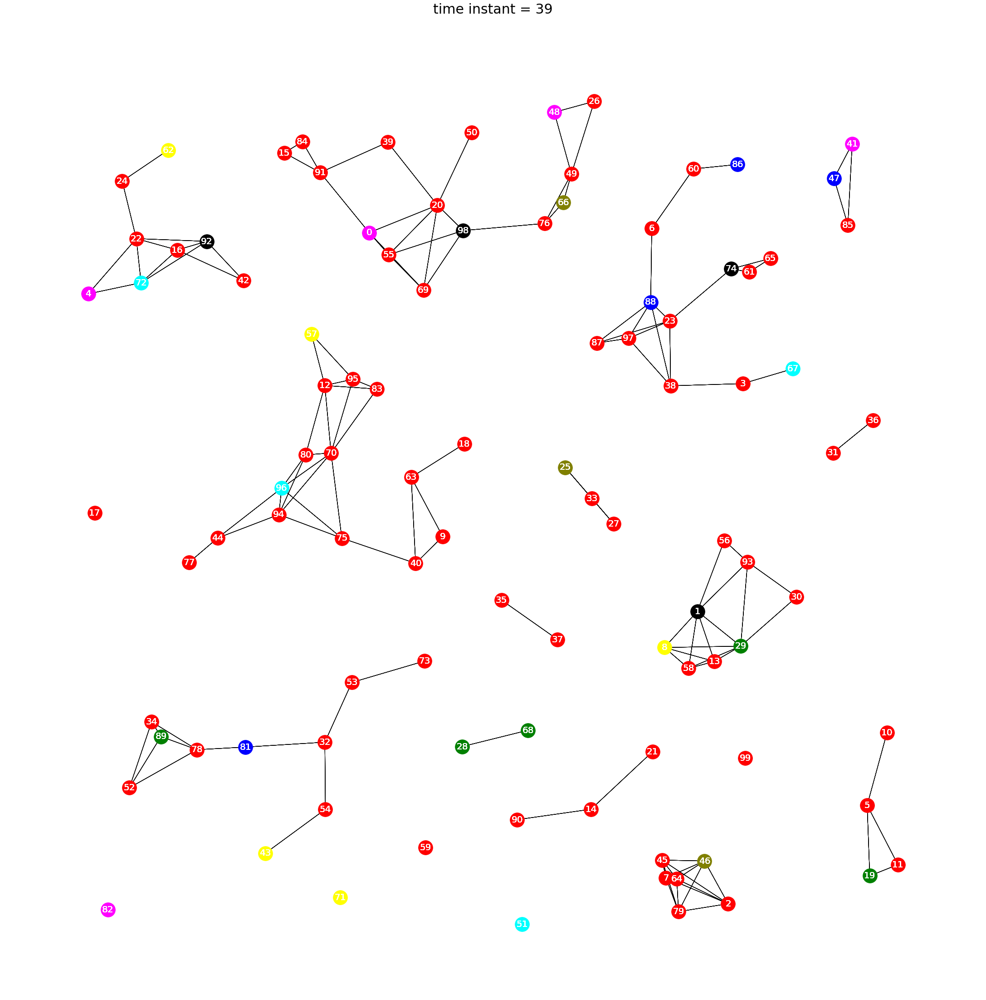

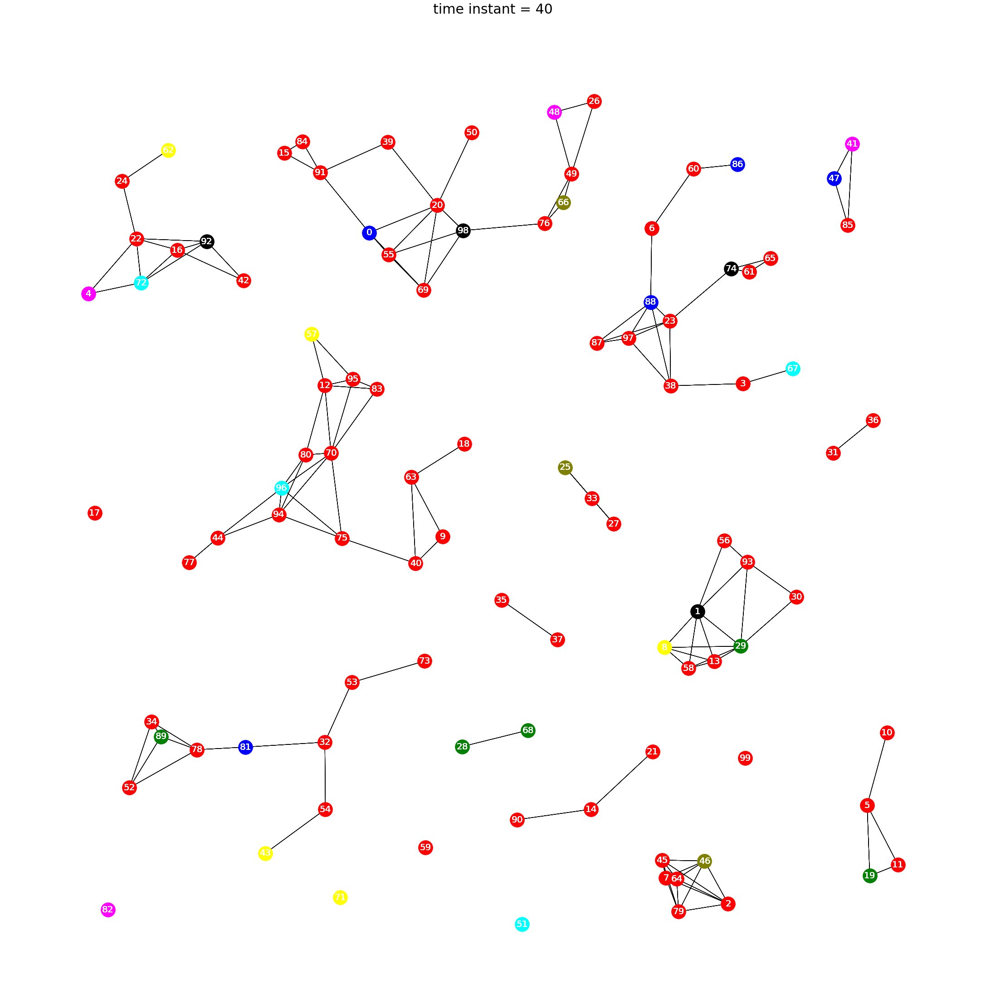

In [26]:
n_steps = t_final+1

# Plot the dynamics

C_rev = dict((v,k) for k,v in C.items())
pos = coord

for t in range(0,n_steps):
    fig = plt.figure(figsize=(30,30))
    x = states[t]
    for c in C_rev:
        nx.draw(G,
            pos = pos,
            with_labels=True,
            nodelist=(np.argwhere(x==c).T[0]).tolist(),
            node_color = C_rev[c],
            arrowsize=30, 
            node_size=1000,
            font_size=20, 
            font_color='white')

    plt.title('time instant = {0}'.format(t), fontsize=30)
    fig.savefig(img_dir + 'img ' + str(img_counter) + '.' + image_format, format=image_format, bbox_inches='tight')
    img_counter += 1

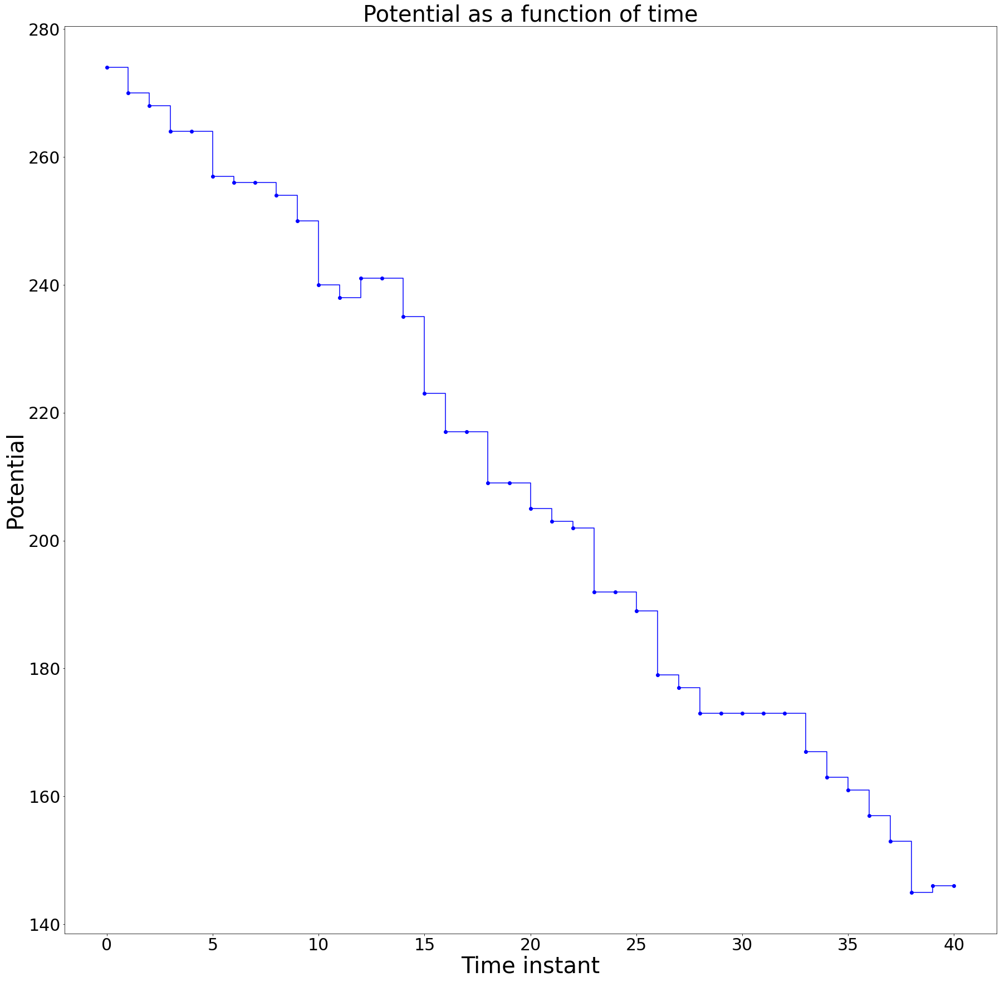

In [27]:
# Plot potential for each time instant

potentials = []
for t in range(0,t_final+1):
    x = states[t]
    pot = potential(x, W, cost)
    potentials.append(pot)

fig = plt.figure(figsize=(30, 30))
plt.step(potentials, 'bo-', where="post")

plt.title('Potential as a function of time', fontsize = 40)
plt.xlabel('Time instant', fontsize = 40)
plt.ylabel('Potential', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

fig.savefig(img_dir + 'img ' + str(img_counter) + '.' + image_format, format=image_format)
img_counter += 1

Study of a near-zero potential solution

In [15]:
# Simulates the learning dynamics on an unweighted graph whith adjacency matrix W.
# Time is discrete, starting from 0.
# 'C': dictionary with possible states.
# 'initial_configuration': initial configuration at time 0, list of strings representing states of nodes
# 'eta': function to determine the inverse of the noise at time t. 'eta' is the name of the function, whose parameter is t and return value is a tuple, whose element in pos 0 is the inverse of the noise at time t.
# 'costf': function to determine the cost, given two states. 'cost' is the name of the function, whose parameters are s and t (1st and second state) and return value is the cost value.
# 'potf': function to determine the potential, given a configuration (can be set to None is 'potential' is not passed as 'termination' parameter). 'potf' is the name of the function, whose parameters are the configuration, the adjacency matrix and the name of the cost funct 'costf' and return value is the potential value.
# 'termination': termination condition, possible values = ['time', 'potential']. 
#     if 'time' is passed, the simulation terminates at time 't_final' (that can be set to None if 'time' is not passed as 'termination' parameter)
#     if 'potential' is passed, the termination condition of the simulation is based on potential of a configuration
# 'pot_final': potential-based condition to terminate the simulation (can be set to None if 'potential' is not passed as 'termination' parameter), possible choices = ['variance':value,iterations, 'final_value':value]
#     if 'variance':value,iterations is passed, the simulation ends when potential does not change more than 'value' for 'iterations' consecutive iterations
#     if 'final_value:value' is passed, the simulation ends when potential reach 'value'

# It returns a tuple (matrix, time) such that:
#     matrix is such that
#         each row i represents the state of each node at time i.
#         each column j represents the state of node j.
#     time is the final time of the configuration 

def simulate(C, W, initial_configuration, eta, costf, potf = None, t_final = None, pot_final = None, termination = 'potential'):
    
    n_nodes = W.shape[0]
    
    stop = False
    if termination=='time':
        if t_final==0:
            stop = True
    if termination=='potential':
        size = 100 # current size of states
        t_final = size-1
        sep1, sep2 = ':', ','
        mode = pot_final.split(sep1)[0]
        if mode=='variance':
            iterations = int(pot_final.split(sep1)[1].split(sep2)[1])
            value = int(pot_final.split(sep1)[1].split(sep2)[0])
            pots_last_iters = [] # list of last iterations potentials
        if mode=='final_value':
            value = int(pot_final.split(sep1)[1])
            
    # store the ids of visited configurations, describing the state of each node
    states = np.zeros((t_final+1, n_nodes), dtype=int)
    # initial configuration set according to 'initial_configuration'
    states[0] = np.array([C[s] for s in initial_configuration])
    
    t = 1
    # for each step of the simulation
    while not stop: # for each unit of time
        if termination!='time':
            if size==t:
                size = size*2 # current size of states
                states.resize((size, n_nodes), refcheck=False)
                
        # choose a node
        node = np.random.choice(n_nodes, 1)[0]
        
        probs = np.zeros(len(C))
        for pos, a in enumerate(C.values()): # for each possible state 'a'
            # calculate probability for node 'node' to update its state to 'a'
            costs = np.array([costf(a,x) for x in states[t-1]])
            probs[pos] = np.exp(-eta(t)[0]*(W[node]@costs))
        probs = probs/np.sum(probs)
        
         # all nodes expect 'node' don't update their state
        states[t] = states[t-1]
        # 'node' node update its state based on 'probs'
        new_state = np.random.choice(list(C.values()), 1, p=probs)[0]
        states[t, node] = new_state
        
        if termination=='time':
            if t==t_final:
                stop = True
        if termination=='potential':
            p = potf(states[t], W, costf)
            if mode=='variance':
                pots_last_iters.append(p) # add current potential to list of last iterations potentials
                if len(pots_last_iters)==iterations+1: # if list is full, remove the oldest iteration
                    pots_last_iters.pop(0)
                if (max(pots_last_iters)-min(pots_last_iters)<=value) and len(pots_last_iters)==iterations:
                    stop = True
            if mode=='final_value':
                if value==p:
                    stop = True
        t+=1
       
    if termination!='time':
        t_final = t-1
        states.resize((t_final+1, n_nodes), refcheck=False)
        
    return states, t_final

condition: final_value:6 - final configuration:
Time unit 438
Configuration:


,state
node,
0,yellow
1,red
2,red
3,olive
4,green
...,...
95,black
96,black
97,red


POTENTIAL: 6.0


condition: final_value:5 - final configuration:
Time unit 675
Configuration:


,state
node,
0,cyan
1,cyan
2,red
3,yellow
4,yellow
...,...
95,red
96,black
97,red


POTENTIAL: 5.0


condition: final_value:4 - final configuration:
Time unit 756
Configuration:


,state
node,
0,yellow
1,magenta
2,cyan
3,yellow
4,yellow
...,...
95,green
96,cyan
97,red


POTENTIAL: 4.0




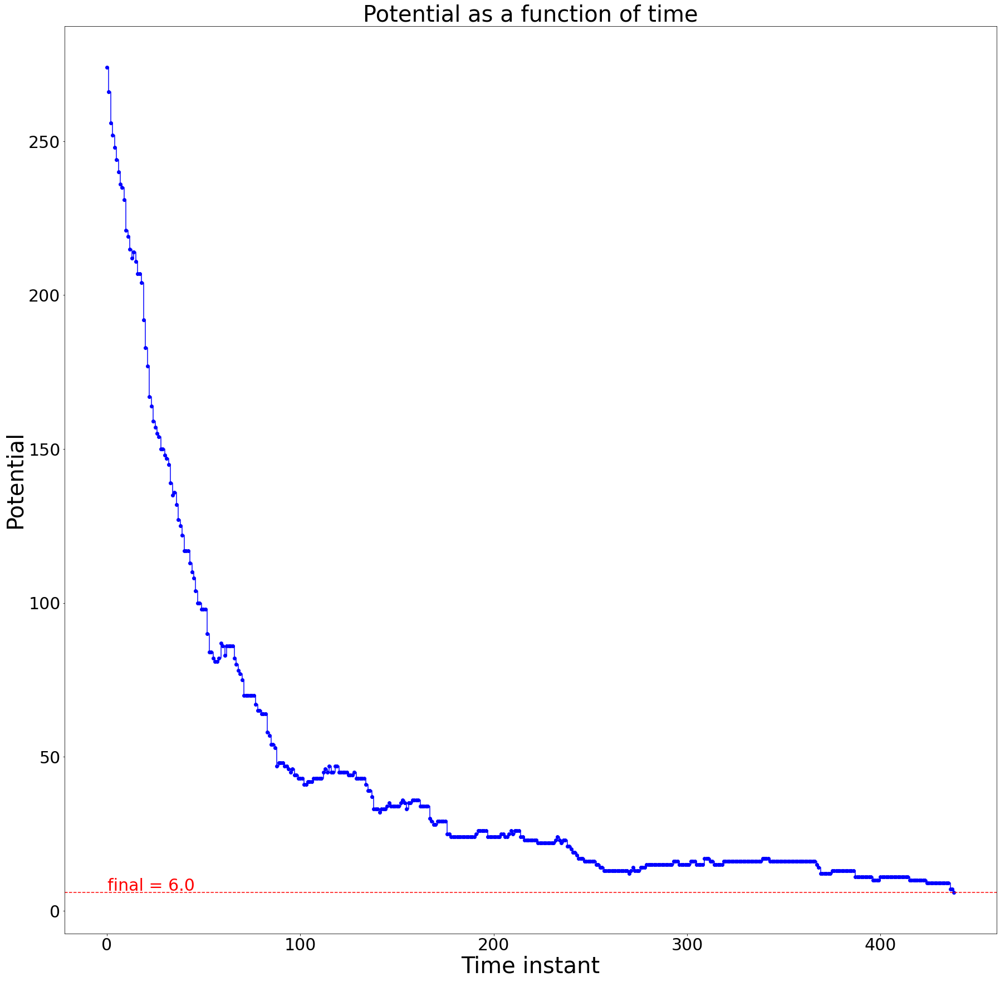

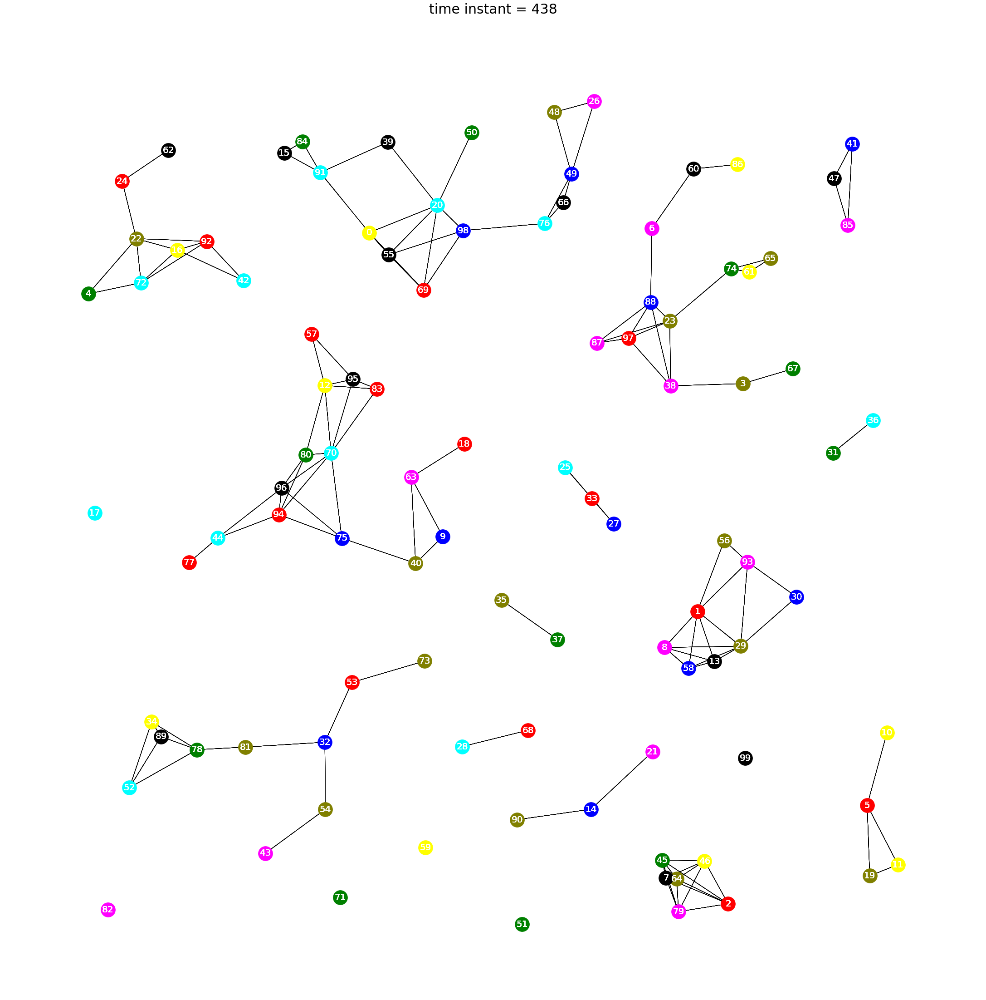

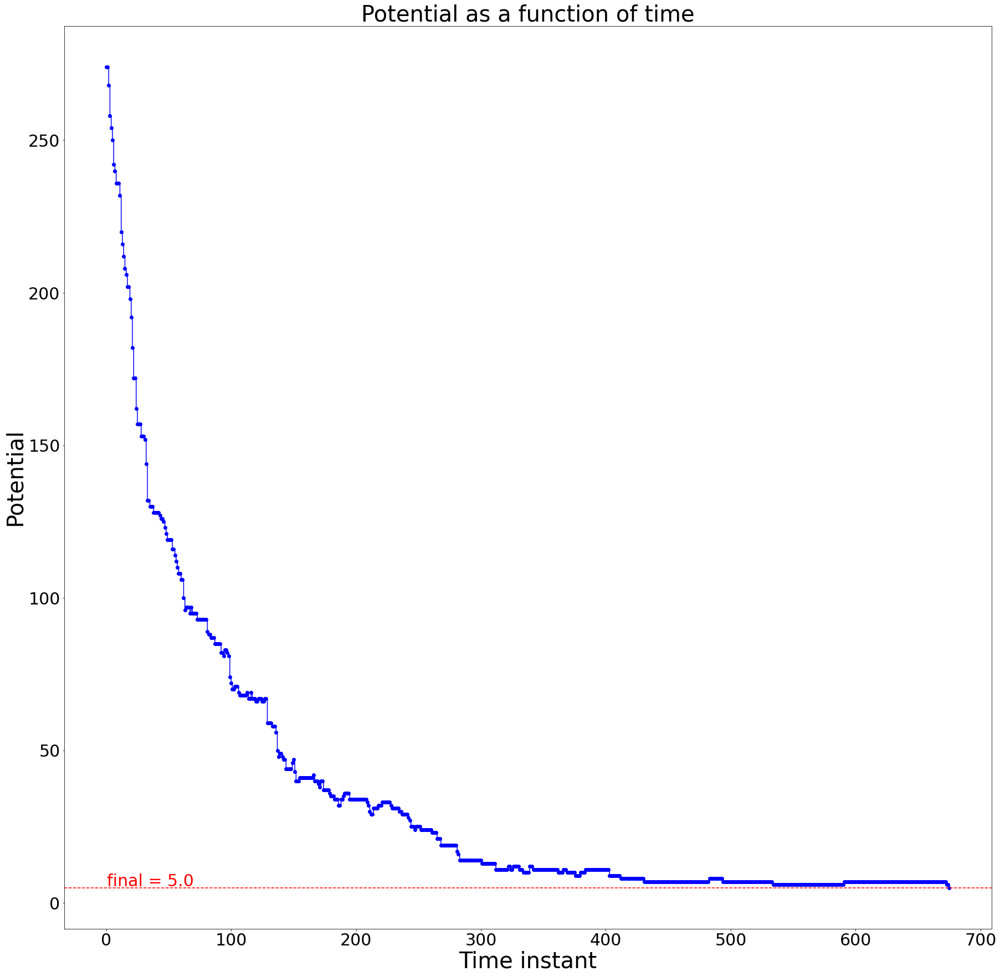

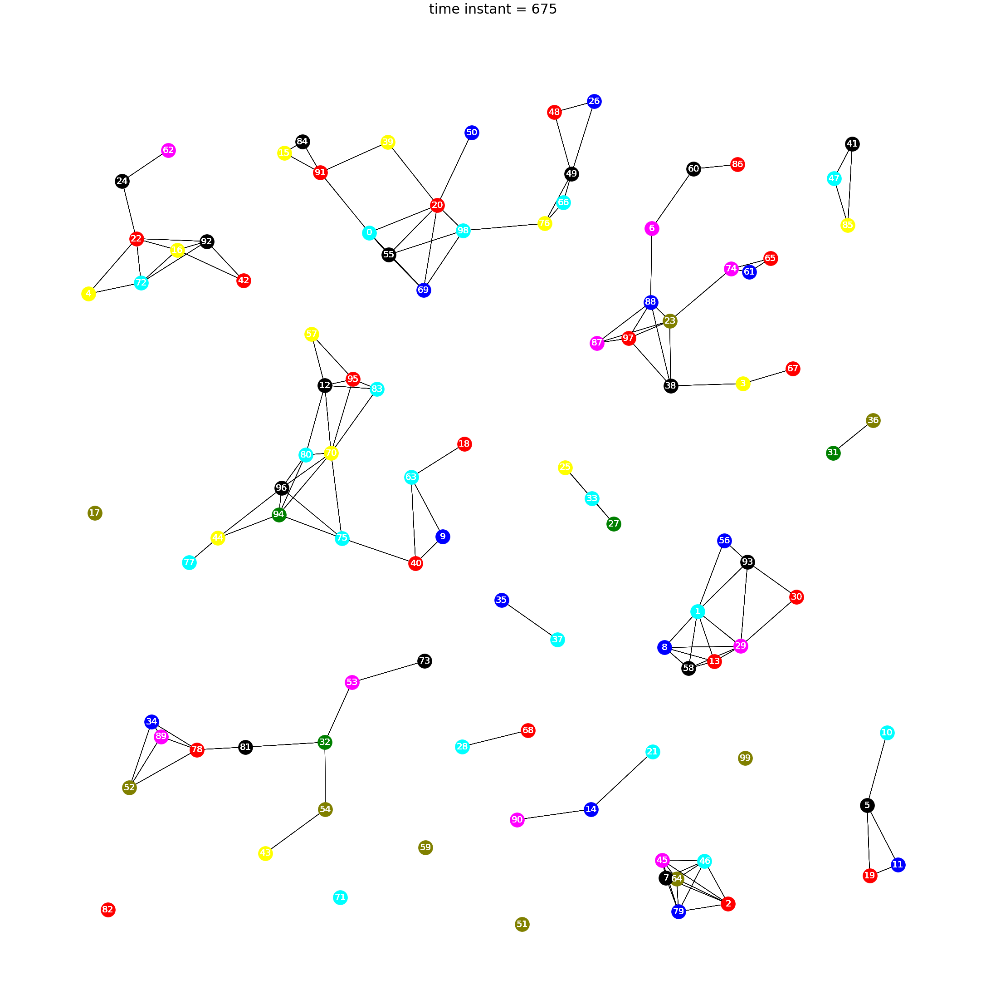

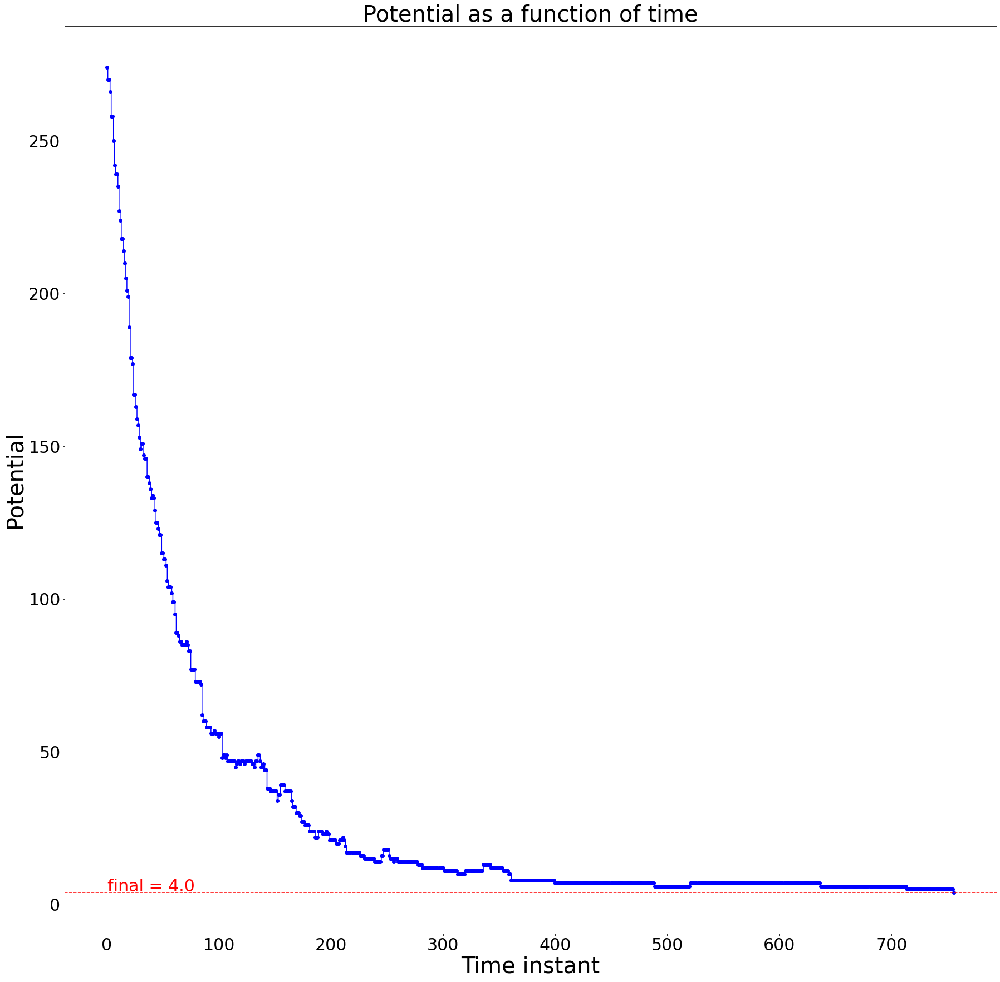

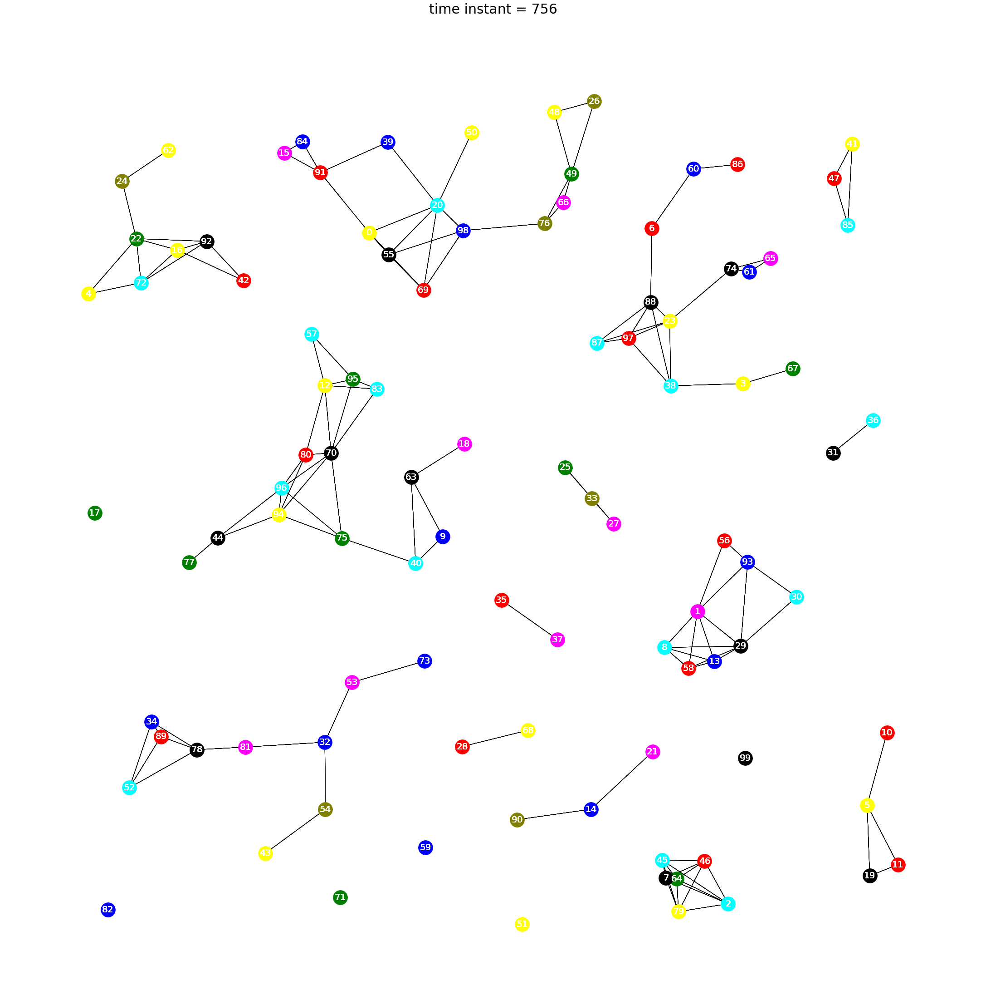

In [29]:
start = 6
stop = 3
for i in range(start,stop,-1):
    condition = 'final_value:' + str(i)
    print("condition:", condition, "- final configuration:")
    states, t_final = simulate(C, W, initial_configuration, inv_noise, cost, potential, pot_final=condition)

    potentials = []
    for t in range(0,t_final+1):
        x = states[t]
        pot = potential(x, W, cost)
        potentials.append(pot)

    fig = plt.figure(figsize=(30, 30))
    plt.step(potentials, 'bo-', where="post")
    y = potentials[-1]
    plt.axhline(y = y, color = 'r', linestyle = 'dashed')
    plt.annotate('final = ' + str(y),
        xy     = (     0.5, y),
        xytext = (1.02*0.5, 1.1*y),
        color  = 'r',
        fontsize = 30
    )

    plt.title('Potential as a function of time', fontsize = 40)
    plt.xlabel('Time instant', fontsize = 40)
    plt.ylabel('Potential', fontsize = 40)
    plt.xticks(fontsize = 30)
    plt.yticks(fontsize = 30)
    
    fig.savefig(img_dir + 'img ' + str(img_counter) + '.' + image_format, format=image_format)
    img_counter += 1

    # Plot the smallest potential configuration
    C_rev = dict((v,k) for k,v in C.items())
    pos = coord

    fig = plt.figure(figsize=(30,30))
    min_index, _ = min(enumerate(potentials), key=itemgetter(1))
    x = states[min_index]
    for c in C_rev:
        nx.draw(G,
            pos = pos,
            with_labels=True,
            nodelist=(np.argwhere(x==c).T[0]).tolist(),
            node_color = C_rev[c],
            arrowsize=30, 
            node_size=1000,
            font_size=20, 
            font_color='white')

    plt.title('time instant = {0}'.format(t_final), fontsize=30)
    
    fig.savefig(img_dir + 'img ' + str(img_counter) + '.' + image_format, format=image_format, bbox_inches='tight')
    img_counter += 1

    # Print the smallest potential configuration and its potential
    pot = potential(x, W, cost)
    print("Time unit " + str(t_final))
    print("Configuration:")
    df = pd.DataFrame(data=[C_rev[z] for z in x], index=np.arange(0, len(G)), columns=['state'])
    df.index.name = 'node'
    display(df)
    print("POTENTIAL:", pot)
    print("\n")

condition: variance:2,50 - final configuration:
Time unit 388
Configuration:


,state
node,
0,black
1,red
2,black
3,cyan
4,black
...,...
95,black
96,magenta
97,blue


POTENTIAL: 6.0


condition: variance:2,100 - final configuration:
Time unit 557
Configuration:


,state
node,
0,blue
1,red
2,olive
3,red
4,blue
...,...
95,blue
96,blue
97,red


POTENTIAL: 8.0


condition: variance:1,50 - final configuration:
Time unit 432
Configuration:


,state
node,
0,red
1,black
2,black
3,magenta
4,olive
...,...
95,magenta
96,cyan
97,black


POTENTIAL: 9.0


condition: variance:1,100 - final configuration:
Time unit 600
Configuration:


,state
node,
0,black
1,magenta
2,black
3,red
4,black
...,...
95,black
96,black
97,red


POTENTIAL: 4.0


condition: variance:0,50 - final configuration:
Time unit 508
Configuration:


,state
node,
0,cyan
1,red
2,red
3,magenta
4,green
...,...
95,black
96,magenta
97,black


POTENTIAL: 4.0


condition: variance:0,100 - final configuration:
Time unit 825
Configuration:


,state
node,
0,blue
1,green
2,yellow
3,olive
4,cyan
...,...
95,black
96,yellow
97,blue


POTENTIAL: 4.0




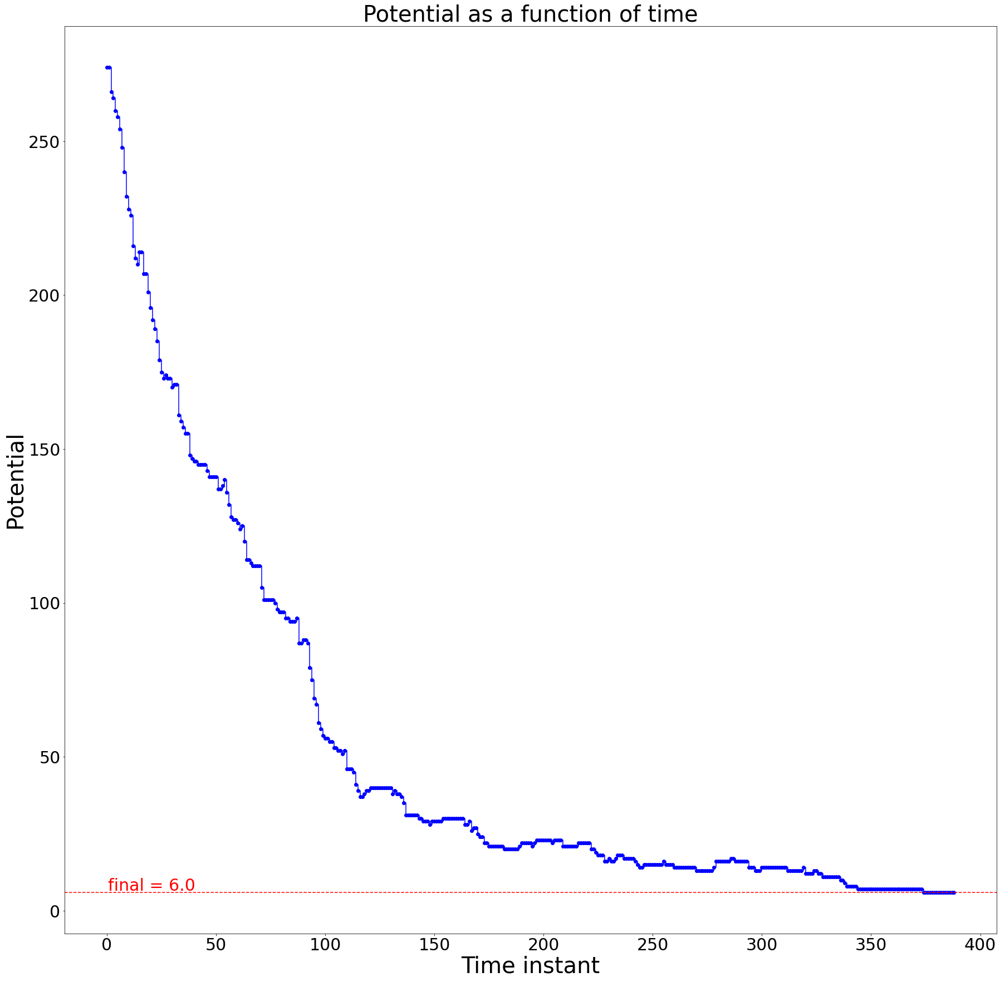

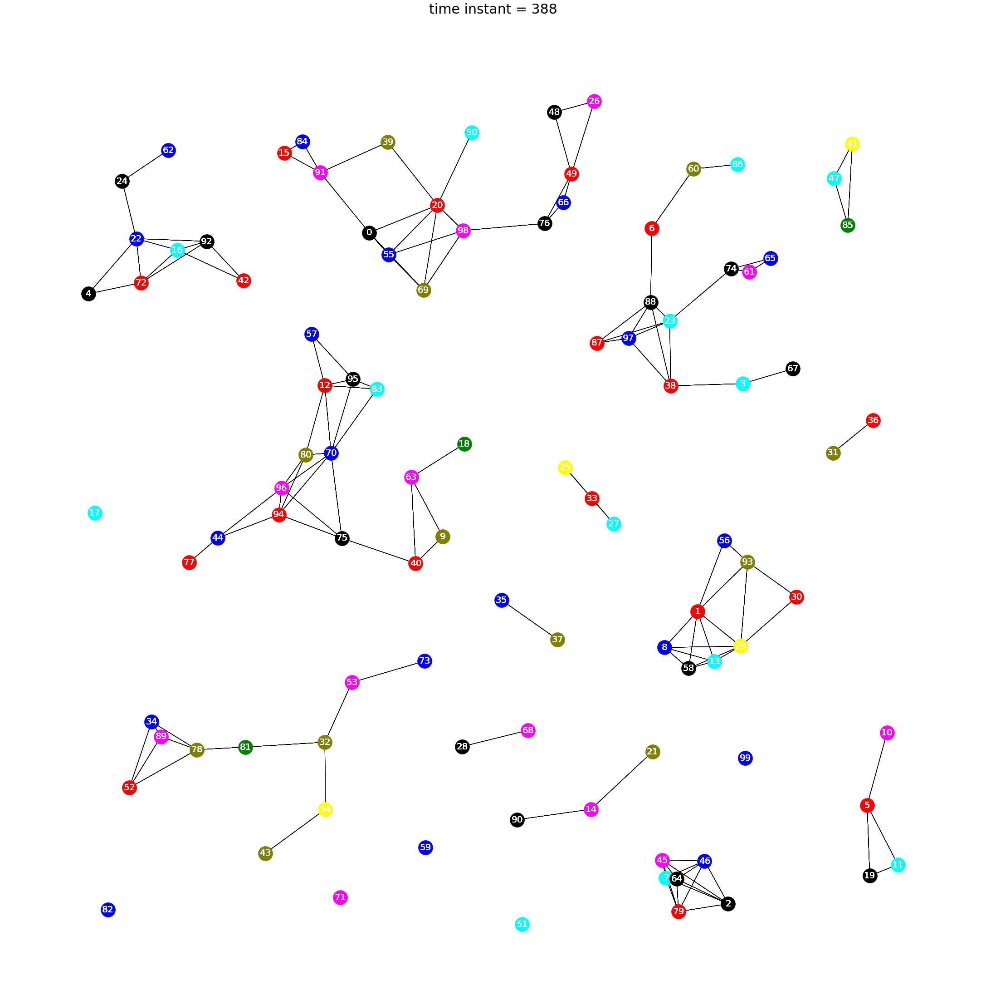

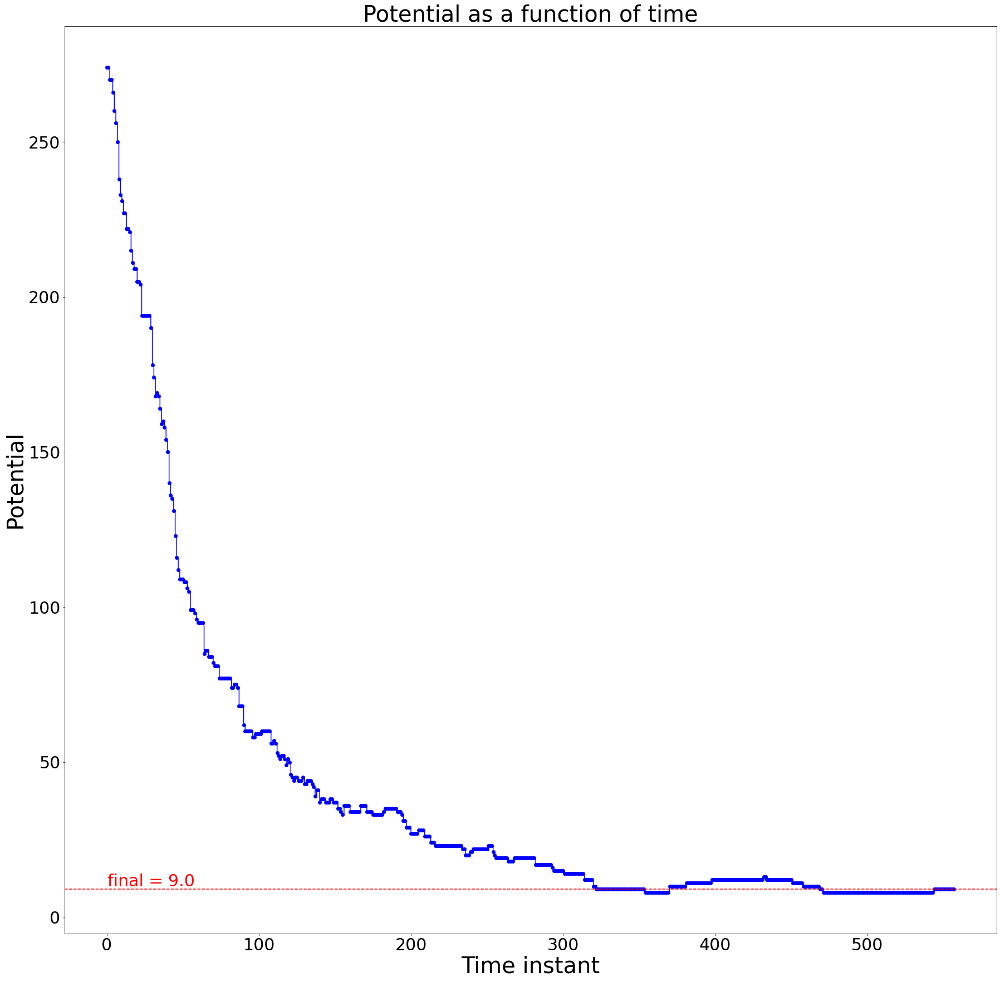

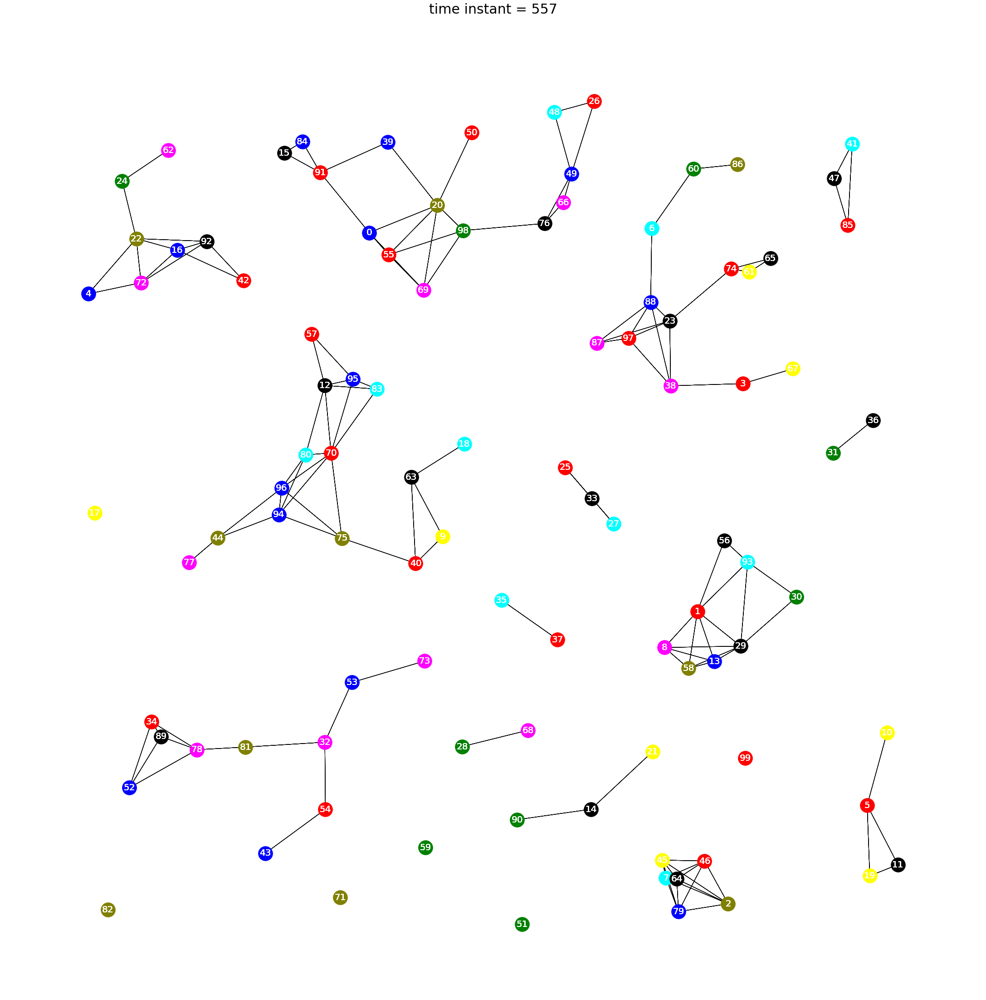

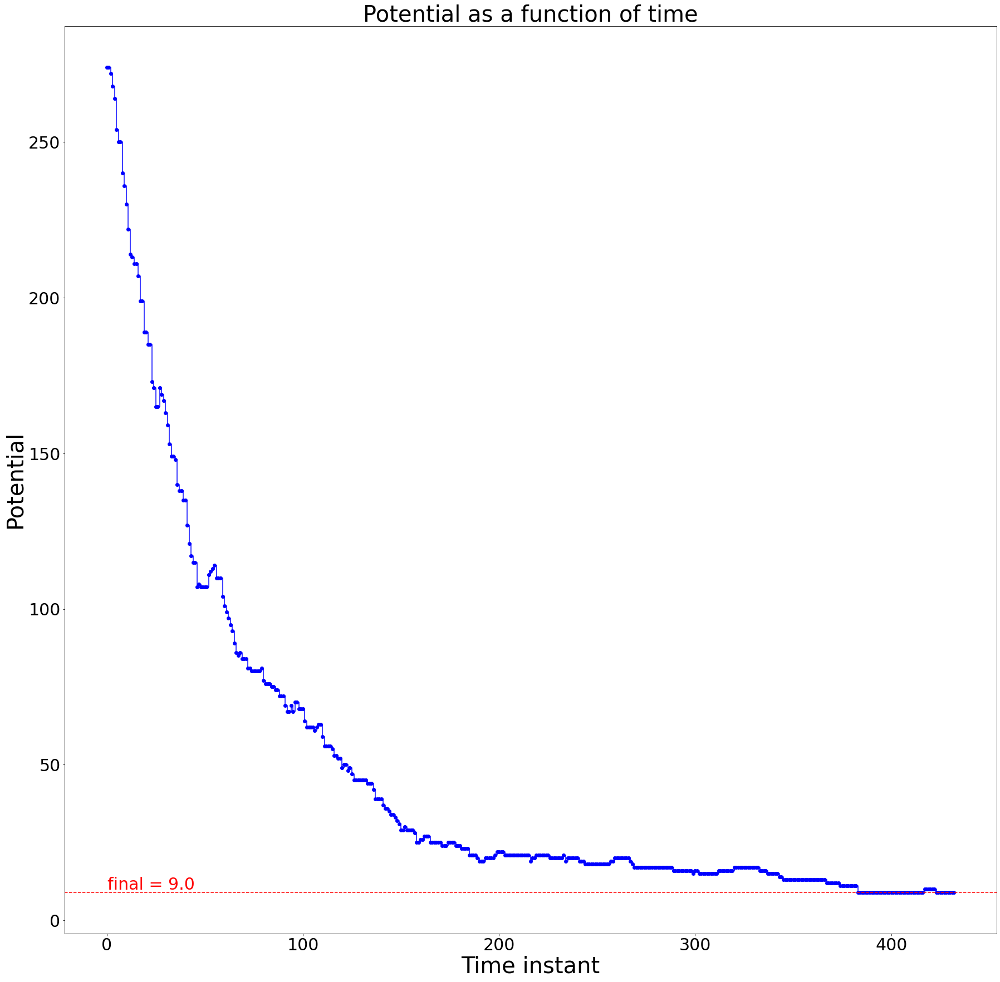

...

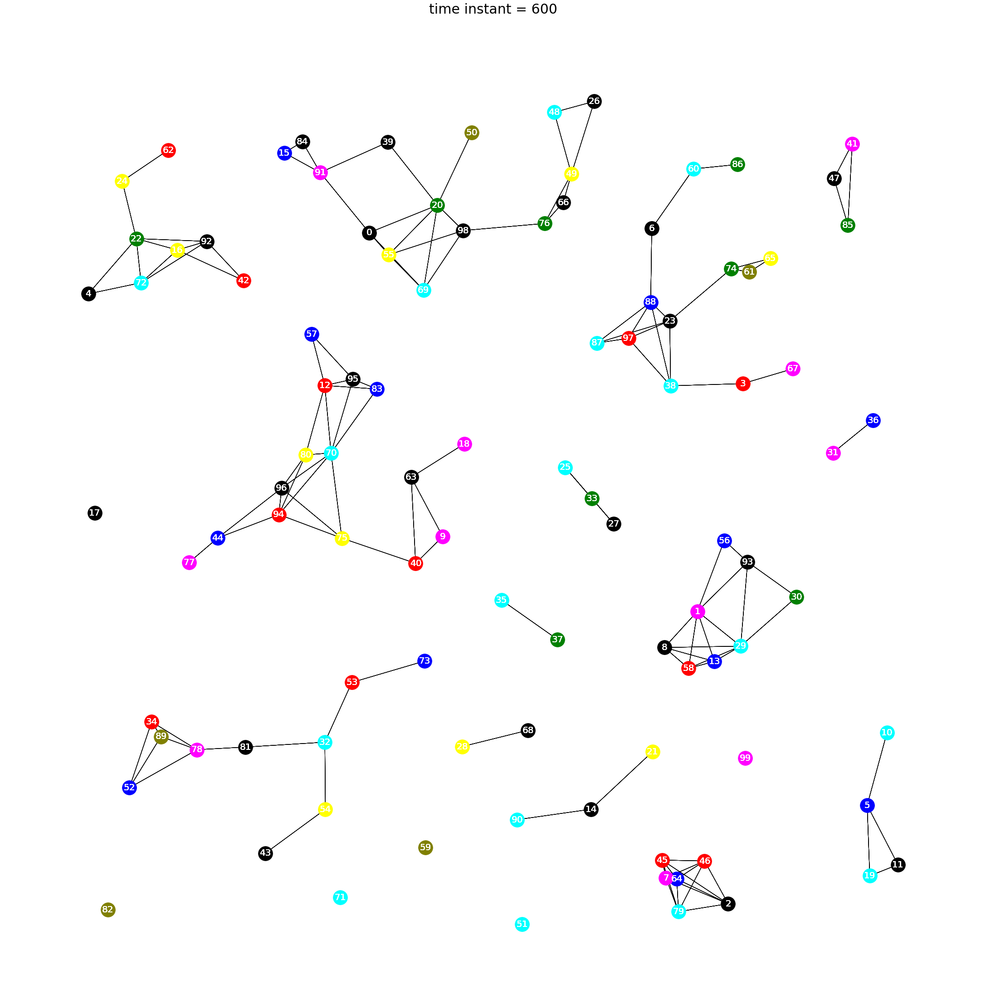

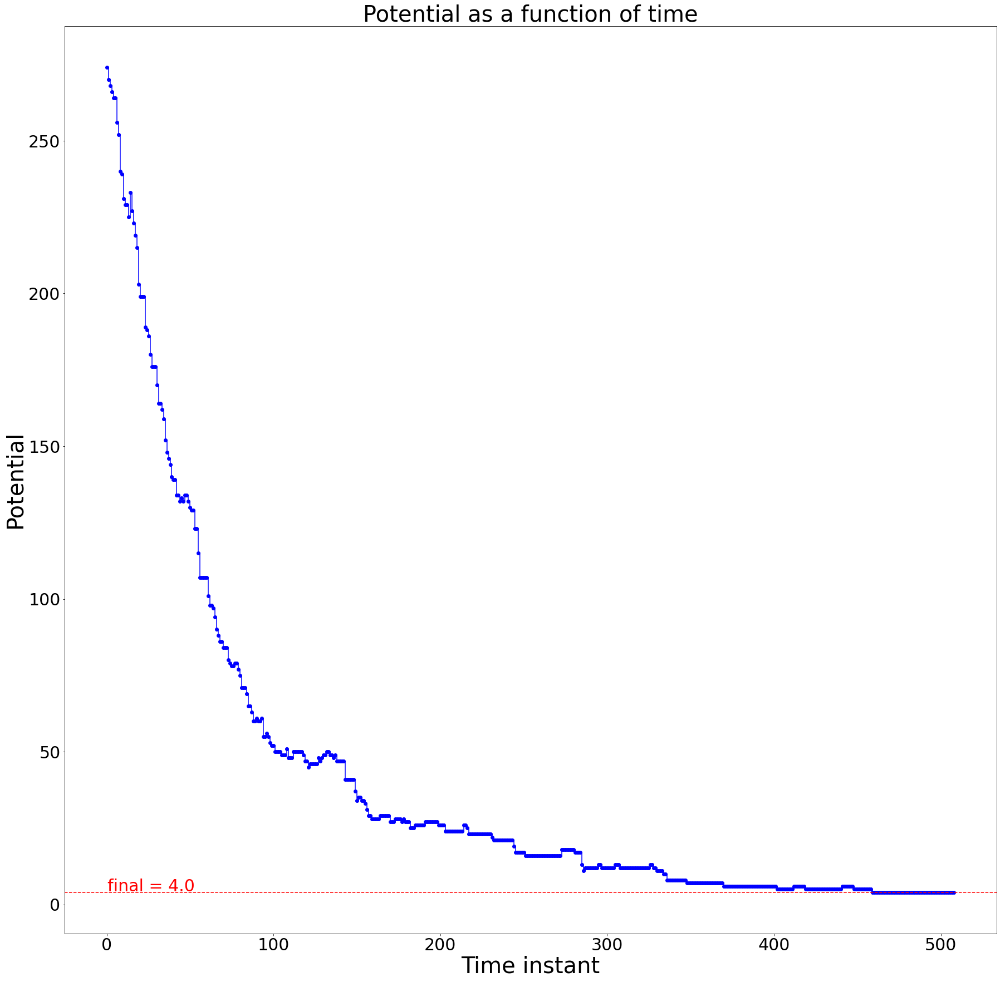

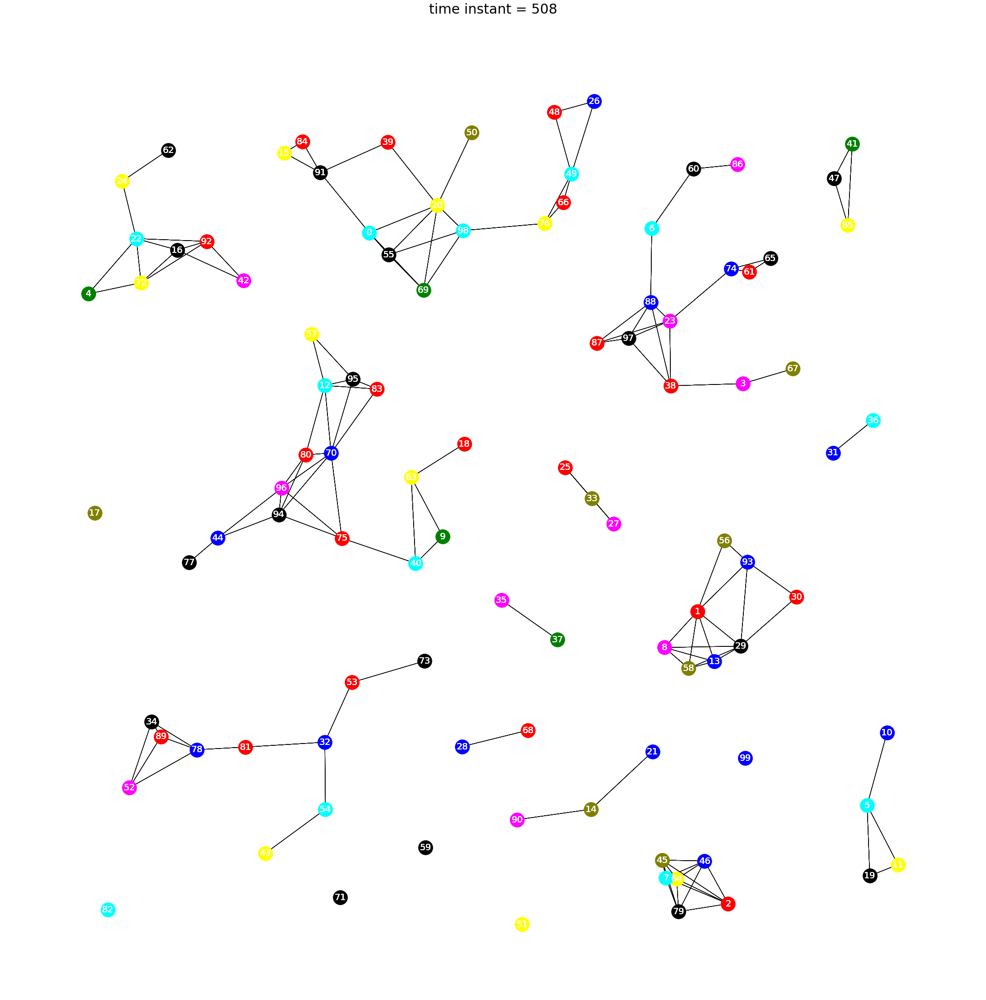

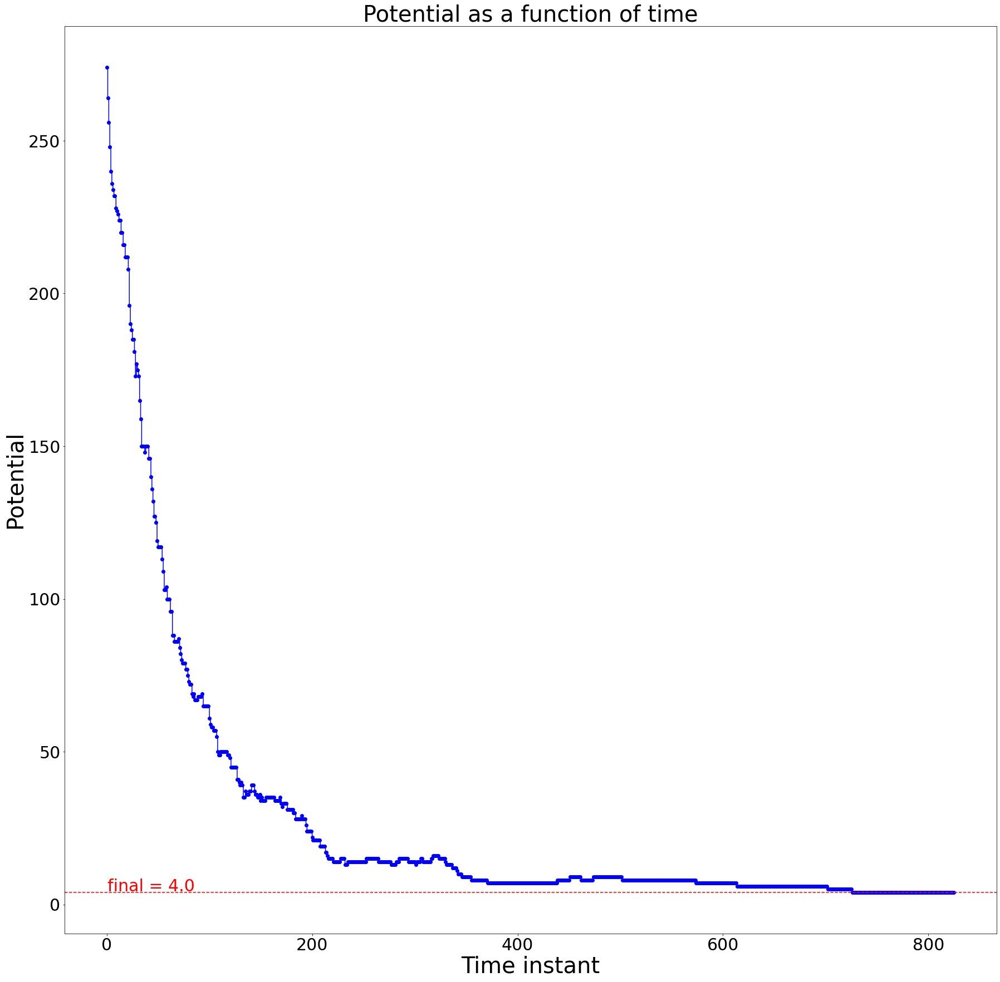

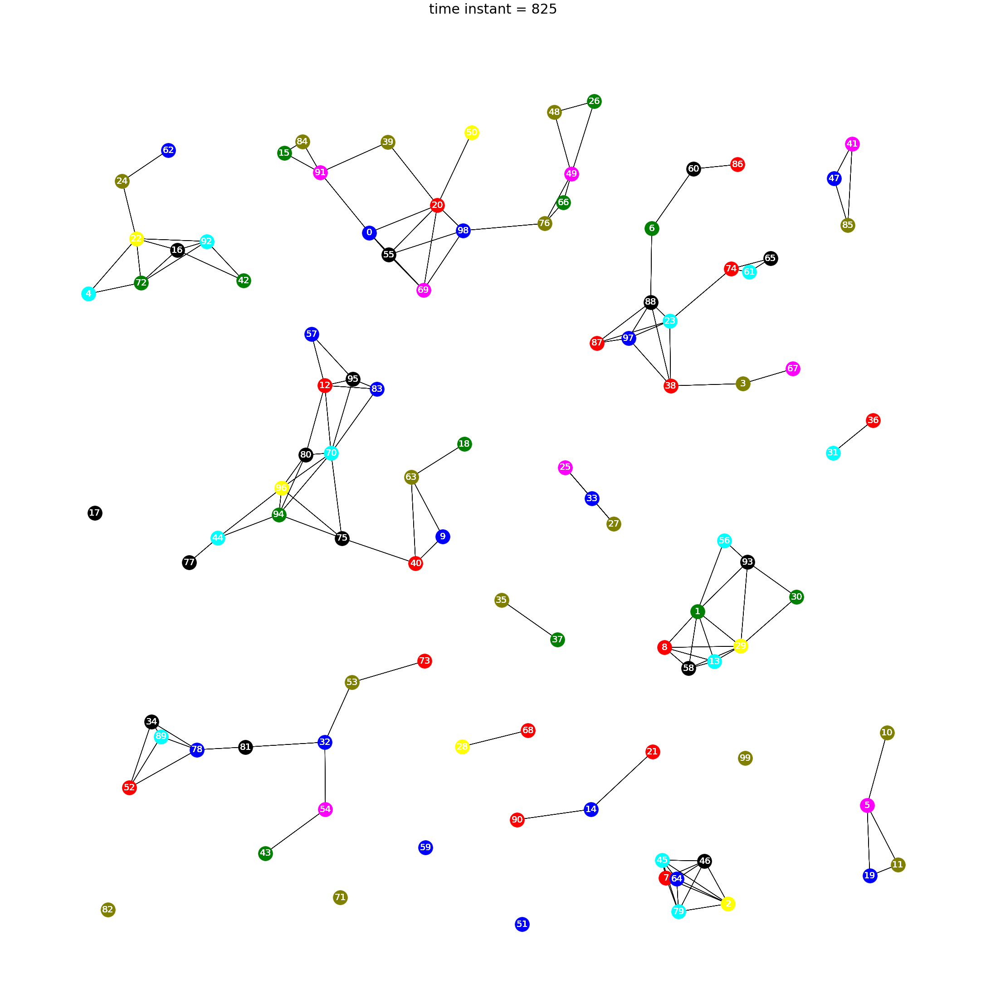

In [30]:
start = 2
stop = -1
for i in range(start,stop,-1):
    v1 = 50
    v2 = 100
    for j in (v1, v2):
        condition = 'variance:' + str(i) + ',' + str(j)
        print("condition:", condition, "- final configuration:")
        states, t_final = simulate(C, W, initial_configuration, inv_noise, cost, potential, pot_final=condition)

        potentials = []
        for t in range(0,t_final+1):
            x = states[t]
            pot = potential(x, W, cost)
            potentials.append(pot)

        fig = plt.figure(figsize=(30, 30))
        plt.step(potentials, 'bo-', where="post")
        y = potentials[-1]
        plt.axhline(y = y, color = 'r', linestyle = 'dashed')
        plt.annotate('final = ' + str(y),
            xy     = (     0.5, y),
            xytext = (1.02*0.5, 1.1*y),
            color  = 'r',
            fontsize = 30
        )

        plt.title('Potential as a function of time', fontsize = 40)
        plt.xlabel('Time instant', fontsize = 40)
        plt.ylabel('Potential', fontsize = 40)
        plt.xticks(fontsize = 30)
        plt.yticks(fontsize = 30)
        
        fig.savefig(img_dir + 'img ' + str(img_counter) + '.' + image_format, format=image_format)
        img_counter += 1

        # Plot the smallest potential configuration
        C_rev = dict((v,k) for k,v in C.items())
        pos = coord

        fig = plt.figure(figsize=(30,30))
        min_index, _ = min(enumerate(potentials), key=itemgetter(1))
        x = states[min_index]
        for c in C_rev:
            nx.draw(G,
                pos = pos,
                with_labels=True,
                nodelist=(np.argwhere(x==c).T[0]).tolist(),
                node_color = C_rev[c],
                arrowsize=30, 
                node_size=1000,
                font_size=20, 
                font_color='white')

        plt.title('time instant = {0}'.format(t_final), fontsize=30)
        
        fig.savefig(img_dir + 'img ' + str(img_counter) + '.' + image_format, format=image_format, bbox_inches='tight')
        img_counter += 1

        # Print the smallest potential configuration and its potential
        pot = potential(x, W, cost)
        print("Time unit " + str(t_final))
        print("Configuration:")
        df = pd.DataFrame(data=[C_rev[z] for z in x], index=np.arange(0, len(G)), columns=['state'])
        df.index.name = 'node'
        display(df)
        print("POTENTIAL:", pot)
        print("\n")